In [252]:
import numpy as np

In [914]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from xgboost import XGBRegressor

In [911]:
pip install xgboost

     ---------------------------------------- 89.1/89.1 MB 2.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [253]:
import pandas as pd

In [254]:
import matplotlib.pyplot as plt

In [255]:
import tensorflow as tf
import seaborn as sns

In [256]:
import keras

In [257]:
import cvlib

In [258]:
import cufflinks as cl

In [259]:
data=pd.read_csv('data.csv')

In [260]:
pd.set_option('display.max_columns',None)

In [261]:
data['Utilities'].unique()

array(['AllPub', 'NoSeWa'], dtype=object)

In [262]:
import re

In [263]:
re.findall(d,data)

NameError: name 'd' is not defined

In [264]:
data.sample(30)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
68,69,30,RM,47.0,4608,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Artery,Norm,1Fam,1Story,4,6,1945,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,CBlock,TA,TA,No,Unf,0,Unf,0,747,747,GasA,TA,Y,SBrkr,747,0,0,747,0,0,1,0,2,1,TA,4,Typ,0,NaN,Attchd,1945.0,Unf,1,220,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal,80000
1048,1049,20,RL,100.0,21750,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,4,1960,2006,Hip,CompShg,HdBoard,HdBoard,BrkFace,75.0,TA,Fa,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1771,0,0,1771,0,0,1,0,3,1,TA,9,Min1,1,TA,Attchd,1960.0,Unf,2,336,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,11,2009,WD,Normal,115000
528,529,30,RL,58.0,9098,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,4,7,1920,2002,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,BrkTil,TA,TA,Mn,ALQ,348,Unf,0,180,528,GasA,Ex,Y,SBrkr,605,0,0,605,1,0,1,0,2,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,144,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal,86000
1279,1280,50,C (all),60.0,7500,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1.5Fin,4,4,1920,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,CBlock,TA,TA,No,Unf,0,Unf,0,698,698,GasA,TA,Y,FuseA,698,430,0,1128,0,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1980.0,RFn,2,528,TA,TA,Y,30,0,164,0,0,0,NaN,NaN,NaN,0,4,2010,COD,Abnorml,68400
552,553,20,RL,87.0,11146,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,Stone,250.0,Gd,TA,PConc,Ex,TA,Av,Unf,0,Unf,0,1709,1709,GasA,Ex,Y,SBrkr,1717,0,0,1717,0,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,3,908,TA,TA,Y,169,39,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,255500
1336,1337,90,RL,87.0,9246,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Feedr,Norm,Duplex,1Story,5,5,1973,1973,Gable,CompShg,Plywood,Plywood,BrkFace,564.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1656,1656,GasA,TA,Y,SBrkr,1656,0,0,1656,0,0,2,0,4,2,TA,8,Typ,0,NaN,Detchd,1973.0,Unf,2,506,TA,TA,Y,0,211,0,0,0,0,NaN,NaN,NaN,0,11,2008,WD,Normal,135000
506,507,60,RL,80.0,9554,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,2Story,8,5,1993,1994,Gable,CompShg,VinylSd,VinylSd,BrkFace,125.0,Gd,TA,PConc,Gd,TA,No,GLQ,380,Unf,0,397,777,GasA,Ex,Y,SBrkr,1065,846,0,1911,0,0,2,1,3,1,Gd,8,Typ,1,TA,Attchd,1993.0,RFn,2,471,TA,TA,Y,182,81,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Normal,215000
1349,1350,70,RM,50.0,5250,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,8,5,1872,1987,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,BrkTil,TA,Fa,No,LwQ,259,Unf,0,425,684,OthW,Fa,N,SBrkr,938,1215,205,2358,0,0,2,0,4,1,TA,8,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,54,20,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,122000
770,771,85,RL,NaN,7252,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,Norm,Norm,1Fam,SFoyer,5,5,1982,1982,Hip,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,Gd,TA,Av,GLQ,685,Unf,0,173,858,GasA,TA,Y,SBrkr,858,0,0,858,1,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1983.0,Unf,2,576,TA,TA,Y,120,0,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,Normal,134900
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA

In [265]:
data.isnull().sum().head(60)

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
Alley           1369
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [266]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [267]:
pd.reset_option('display.max_rows',None)

In [268]:
data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [269]:
import seaborn as sns

<AxesSubplot:xlabel='WoodDeckSF'>

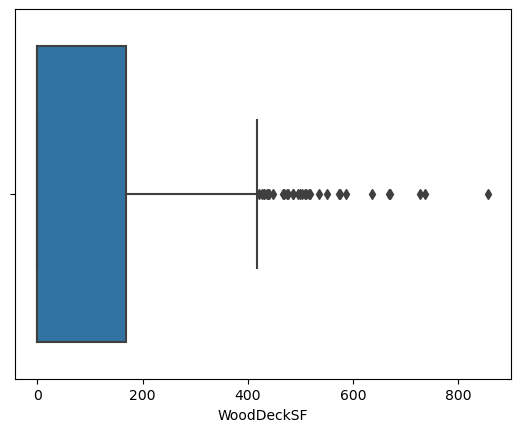

In [270]:
sns.boxplot(x=data['WoodDeckSF'])

In [271]:
bata=data.describe()

In [272]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [273]:
bata.corr()['SalePrice']

Id               0.514661
MSSubClass      -0.225454
LotFrontage     -0.102078
LotArea          0.965051
OverallQual     -0.324121
OverallCond     -0.324596
YearBuilt        0.318675
YearRemodAdd     0.302555
MasVnrArea       0.529356
BsmtFinSF1       0.902525
BsmtFinSF2       0.473211
BsmtUnfSF        0.752455
TotalBsmtSF      0.947279
1stFlrSF         0.939934
2ndFlrSF         0.656714
LowQualFinSF     0.037182
GrLivArea        0.962419
BsmtFullBath    -0.326830
BsmtHalfBath    -0.327377
FullBath        -0.327146
HalfBath        -0.327446
BedroomAbvGr    -0.324331
KitchenAbvGr    -0.326987
TotRmsAbvGrd    -0.321906
Fireplaces      -0.326930
GarageYrBlt      0.324284
GarageCars      -0.326568
GarageArea       0.509031
WoodDeckSF       0.207876
OpenPorchSF      0.019137
EnclosedPorch    0.022557
3SsnPorch       -0.001386
ScreenPorch     -0.023421
PoolArea         0.140303
MiscVal          0.927540
MoSold          -0.323115
YrSold           0.287595
SalePrice        1.000000
Name: SalePr

In [274]:
from pandas_profiling import ProfileReport

In [275]:
import pandas

In [276]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [277]:
from pandas_profiling import profile_report

In [278]:
data.loc[data['LotFrontage'].isnull()==True,'LotFrontage'].info()

<class 'pandas.core.series.Series'>
Int64Index: 259 entries, 7 to 1446
Series name: LotFrontage
Non-Null Count  Dtype  
--------------  -----  
0 non-null      float64
dtypes: float64(1)
memory usage: 4.0 KB


In [279]:
data['SalePrice']

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [280]:
data['Utilities'].value_counts()

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

<AxesSubplot:xlabel='Utilities', ylabel='SalePrice'>

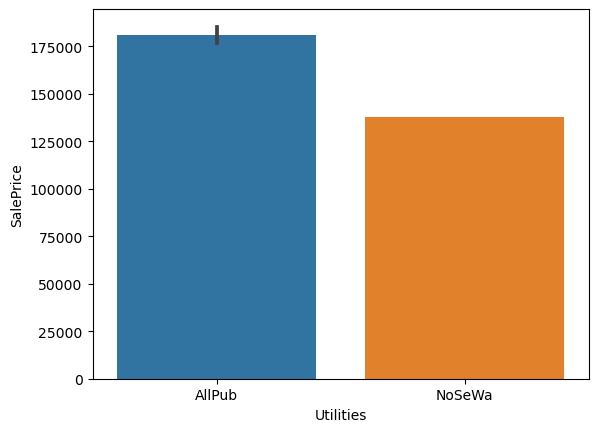

In [281]:
sns.barplot(x=data['Utilities'],y=data['SalePrice'])

In [282]:
from pandas_profiling import ProfileReport

In [284]:
#ProfileReport(bata)

In [285]:
import seaborn as sns
import matplotlib.pyplot as plt

In [286]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [287]:
data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [288]:
np.median(data['LotFrontage'])

nan

In [289]:
np.mean(data['LotFrontage'])

70.04995836802665

<AxesSubplot:xlabel='LotFrontage', ylabel='Count'>

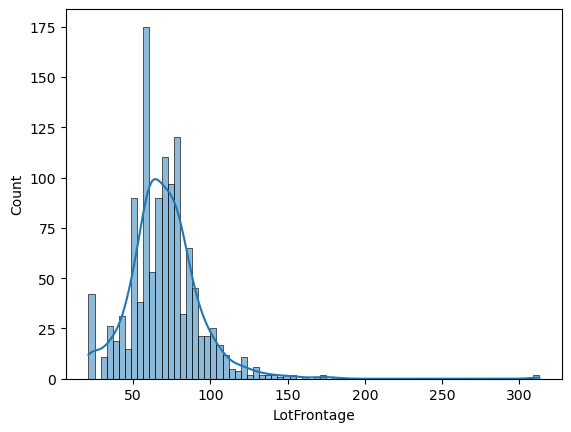

In [290]:
sns.histplot(data['LotFrontage'],kde=True)

In [291]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [292]:
import numpy as np

In [293]:
import pandas as pd
from pandas_profiling import ProfileReport

In [294]:
data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [295]:
data['LotFrontage']

0       65.0
1       80.0
2       68.0
3       60.0
4       84.0
        ... 
1455    62.0
1456    85.0
1457    66.0
1458    68.0
1459    75.0
Name: LotFrontage, Length: 1460, dtype: float64

In [296]:
data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [297]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [298]:
data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [299]:
data['LotFrontage']

0       65.0
1       80.0
2       68.0
3       60.0
4       84.0
        ... 
1455    62.0
1456    85.0
1457    66.0
1458    68.0
1459    75.0
Name: LotFrontage, Length: 1460, dtype: float64

In [300]:
np.mean(data['MSSubClass'])

56.897260273972606

In [301]:
import seaborn as sns

<AxesSubplot:xlabel='MSSubClass', ylabel='Count'>

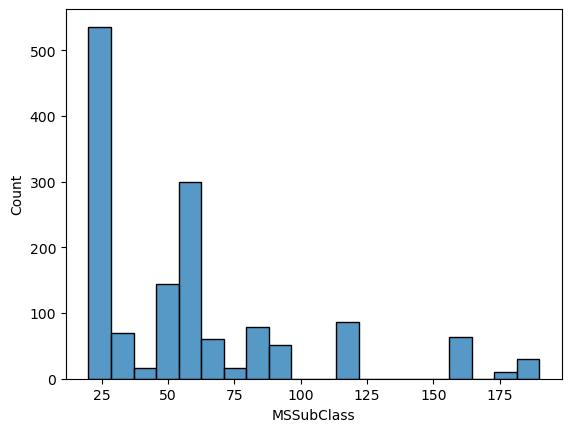

In [302]:
sns.histplot(data['MSSubClass'])

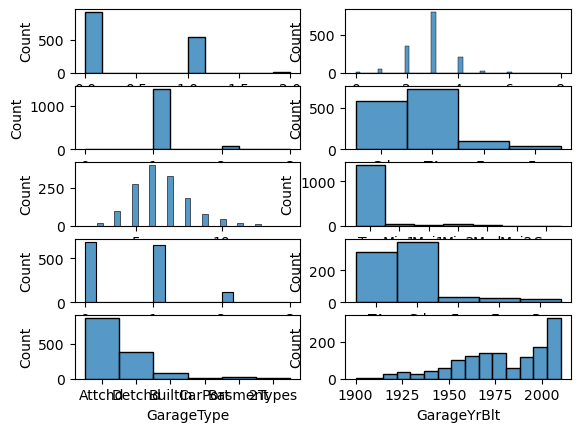

In [303]:
plotnumber=1
for i in range(50,60):
    gg=data.columns[i]
    plt.subplot(5,2,plotnumber)
    sns.histplot(data[gg])
    plotnumber+=1

In [304]:
data.columns[20]

'YearRemodAdd'

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

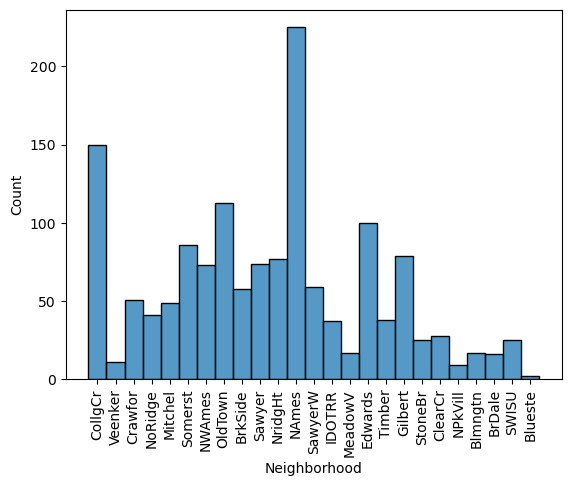

In [305]:
sns.histplot(data['Neighborhood'])
plt.xticks(rotation='vertical')

In [306]:
data['Neighborhood']

0       CollgCr
1       Veenker
2       CollgCr
3       Crawfor
4       NoRidge
         ...   
1455    Gilbert
1456     NWAmes
1457    Crawfor
1458      NAmes
1459    Edwards
Name: Neighborhood, Length: 1460, dtype: object

In [307]:
pd.set_option('display.max_columns',None)

In [308]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [309]:
data.isnull().sum().sample(50)

BsmtFinSF1          0
GrLivArea           0
ExterQual           0
MSSubClass          0
GarageQual         81
Electrical          1
SaleType            0
OverallQual         0
TotRmsAbvGrd        0
YearBuilt           0
HalfBath            0
BsmtQual           37
Exterior1st         0
GarageYrBlt        81
ScreenPorch         0
BsmtHalfBath        0
BsmtFinSF2          0
HouseStyle          0
MiscFeature      1406
LandSlope           0
WoodDeckSF          0
MasVnrType          8
Fence            1179
Alley            1369
3SsnPorch           0
GarageCond         81
Condition2          0
2ndFlrSF            0
PoolQC           1453
Functional          0
EnclosedPorch       0
Utilities           0
PoolArea            0
Condition1          0
BedroomAbvGr        0
BsmtCond           37
FireplaceQu       690
LotFrontage       259
YearRemodAdd        0
Foundation          0
BsmtFinType1       37
MSZoning            0
LowQualFinSF        0
GarageCars          0
BsmtUnfSF           0
RoofMatl  

In [310]:
data['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [311]:
data.loc[data['LotFrontage'].isnull()==True,'LotFrontage']=np.mean(data['LotFrontage'])

In [312]:
data['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [313]:
data.loc

In [314]:
data['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [315]:
data['BsmtCond'].value_counts()

TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [316]:
data.loc[data['BsmtCond'].isnull()==True,'BsmtCond']='Shed'

In [317]:
data.loc[data['BsmtCond']=='Shed','BsmtCond']

17      Shed
39      Shed
90      Shed
102     Shed
156     Shed
182     Shed
259     Shed
342     Shed
362     Shed
371     Shed
392     Shed
520     Shed
532     Shed
533     Shed
553     Shed
646     Shed
705     Shed
736     Shed
749     Shed
778     Shed
868     Shed
894     Shed
897     Shed
984     Shed
1000    Shed
1011    Shed
1035    Shed
1045    Shed
1048    Shed
1049    Shed
1090    Shed
1179    Shed
1216    Shed
1218    Shed
1232    Shed
1321    Shed
1412    Shed
Name: BsmtCond, dtype: object

In [318]:
data['BsmtFinType2'].isnull().sum()

38

In [319]:
data['BsmtFinType2'].value_counts()

Unf    1256
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [320]:
data.loc[data['BsmtFinType2'].isnull()==True,'BsmtFinType2']='Unf'

In [321]:
BsmtFinType1

NameError: name 'BsmtFinType1' is not defined

In [322]:
data['BsmtFinType1'].value_counts()

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64

In [323]:
data.loc[data['BsmtFinType1'].isnull()==True,'BsmtFinType1']='Unf'

In [324]:
GarageType

NameError: name 'GarageType' is not defined

In [325]:
data['GarageType'].value_counts()

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [326]:
data.loc[data['GarageType'].isnull()==True,'GarageType']='Attchd'

In [327]:
BsmtExposure

NameError: name 'BsmtExposure' is not defined

In [328]:
data['BsmtExposure'].value_counts()

No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64

In [329]:
data.loc[data['BsmtExposure'].isnull()==True,'BsmtExposure']='No'

In [330]:
BsmtQual

NameError: name 'BsmtQual' is not defined

In [331]:
data['BsmtQual'].value_counts()

TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [332]:
data.loc[data['BsmtQual'].isnull()==True,'BsmtQual']='TA'

In [333]:
data['BsmtQual'].value_counts()

TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [334]:
data['BsmtQual']

0       Gd
1       Gd
2       Gd
3       TA
4       Gd
        ..
1455    Gd
1456    Gd
1457    TA
1458    TA
1459    TA
Name: BsmtQual, Length: 1460, dtype: object

In [335]:
data['GarageYrBlt']

0       2003.0
1       1976.0
2       2001.0
3       1998.0
4       2000.0
         ...  
1455    1999.0
1456    1978.0
1457    1941.0
1458    1950.0
1459    1965.0
Name: GarageYrBlt, Length: 1460, dtype: float64

In [336]:

def fif(i):
    if i=='Gd' or i=='TA' or i=='Fa' or i=='Ex' or i=='Po':
        return i
    else:
        return 'Gd'
    
        
        

In [337]:
data['FireplaceQu'].apply(fif)

0       Gd
1       TA
2       TA
3       Gd
4       TA
        ..
1455    TA
1456    TA
1457    Gd
1458    Gd
1459    Gd
Name: FireplaceQu, Length: 1460, dtype: object

In [338]:
d

NameError: name 'd' is not defined

In [ ]:
data['FireplaceQu'].value_counts()

In [ ]:
data['GarageFinish'].value_counts()

In [339]:
def fifa(i):
    if i=='Unf' or i=='RFn' or i=='Fin':
        return i
    else:
        return 'Unf'

In [340]:
data['GarageFinish']=data['GarageFinish'].apply

In [341]:
data['GarageFinish'].isnull().sum()

0

In [342]:
data.isnull()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [343]:
r=[]
for i in range(10):
    r.append(i)

In [344]:
r=list(r)

In [345]:
r1=[]
g1=[]
def op(i):
    if i%2==0:
        r1.append(i)
    else:
        g1.append(i)
        

In [346]:
op(r)

TypeError: unsupported operand type(s) for %: 'list' and 'int'

In [347]:
def ppp(i):
    if i[:3]=='All':
        return i[:2]
    else:
        return i

In [348]:
data['all']=data['Utilities'].apply(ppp)

In [349]:
data['all']

0       Al
1       Al
2       Al
3       Al
4       Al
        ..
1455    Al
1456    Al
1457    Al
1458    Al
1459    Al
Name: all, Length: 1460, dtype: object

In [350]:
company_avg=data.groupby('SaleCondition')
company_avg['SaleCondition','SalePrice'].mean()

C:\Users\syed mujahid\AppData\Local\Temp\ipykernel_8288\3748372204.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,SalePrice
SaleCondition,
Abnorml,146526.623762
AdjLand,104125.000000
Alloca,167377.416667
Family,149600.000000
Normal,175202.219533
Partial,272291.752000


In [351]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0

In [352]:
data.isnull().sum().head(40)

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley           1369
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
dtype: int64

In [353]:
data.loc[data['Alley'].isnull()==True,'Alley']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
1455    NaN
1456    NaN
1457    NaN
1458    NaN
1459    NaN
Name: Alley, Length: 1369, dtype: object

In [354]:
data.loc[1200:,'Alley']='Pave'

In [355]:
data['Alley'].value_counts()

Pave    294
Grvl     41
Name: Alley, dtype: int64

In [356]:
data['PoolQC'].value_counts()

Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64

In [357]:
data.loc[1200:,'PoolQC']='Gd'

In [358]:
data.isnull().sum().tail(50)

BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1          0
BsmtFinType2        0
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu       690
GarageType          0
GarageYrBlt        81
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual         81
GarageCond         81
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC           1196
Fence            1179
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold    

In [359]:
data['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [360]:
data.loc[data['FireplaceQu'].isnull()==True,'FireplaceQu']='Gd'

In [361]:
data['FireplaceQu']

0       Gd
1       TA
2       TA
3       Gd
4       TA
        ..
1455    TA
1456    TA
1457    Gd
1458    Gd
1459    Gd
Name: FireplaceQu, Length: 1460, dtype: object

In [362]:
np.mean(data['GarageYrBlt'])

1978.5061638868744

In [363]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,NaN,NaN,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,NaN,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0

In [364]:
data.loc[data['MasVnrType'].isnull()==True,'MasVnrType']

234     NaN
529     NaN
650     NaN
936     NaN
973     NaN
977     NaN
1243    NaN
1278    NaN
Name: MasVnrType, dtype: object

In [365]:
data['MasVnrType'].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [366]:
data.loc[data['PoolQC'].isnull()==True,'PoolQC']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
1195    NaN
1196    NaN
1197    NaN
1198    NaN
1199    NaN
Name: PoolQC, Length: 1196, dtype: object

In [367]:
data['PoolQC'].value_counts()

Gd    261
Ex      2
Fa      1
Name: PoolQC, dtype: int64

In [368]:
data.isnull().sum().tail(40)

Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu         0
GarageType          0
GarageYrBlt        81
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual         81
GarageCond         81
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC           1196
Fence            1179
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
all                 0
dtype: int64

In [369]:
data['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [373]:
data.loc[100:500,'MiscFeature']

100     NaN
101     NaN
102     NaN
103     NaN
104     NaN
       ... 
496     NaN
497     NaN
498     NaN
499    Shed
500     NaN
Name: MiscFeature, Length: 401, dtype: object

In [374]:
data.loc[data['Alley'].isnull()==True,'Alley']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
1195    NaN
1196    NaN
1197    NaN
1198    NaN
1199    NaN
Name: Alley, Length: 1125, dtype: object

In [375]:
data['Alley'].value_counts()

Pave    294
Grvl     41
Name: Alley, dtype: int64

In [376]:
data.loc[data['Alley']=='Pave']

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
30,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,GasA,TA,N,SBrkr,649,668,0,1317,0,0,1,0,3,1,TA,6,Typ,0,Gd,Detchd,1920.0,<bound method Series.apply of 0 RFn\n1 ...,1,250,TA,Fa,N,0,54,172,0,0,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000,Al
56,57,160,FV,24.0,2645,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,Twnhs,2Story,8,5,1999,2000,Gable,CompShg,MetalSd,MetalSd,BrkFace,456.0,Gd,TA,PConc,Gd,TA,No,GLQ,649,Unf,0,321,970,GasA,Ex,Y,SBrkr,983,756,0,1739,1,0,2,1,3,1,Gd,7,Typ,0,Gd,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,480,TA,TA,Y,115,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Abnorml,172500,Al
87,88,160,FV,40.0,3951,Pave,Pave,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,TwnhsE,2Story,6,5,2009,2009,Gable,CompShg,VinylSd,VinylSd,Stone,76.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,612,612,GasA,Ex,Y,SBrkr,612,612,0,1224,0,0,2,1,2,1,Gd,4,Typ,0,Gd,Detchd,2009.0,<bound method Series.apply of 0 RFn\n1 ...,2,528,TA,TA,Y,0,234,0,0,0,0,NaN,NaN,NaN,0,6,2009,New,Partial,164500,Al
115,116,160,FV,34.0,3230,Pave,Pave,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,TwnhsE,2Story,6,5,1999,1999,Gable,CompShg,MetalSd,MetalSd,BrkFace,1129.0,TA,TA,PConc,Gd,TA,No,GLQ,419,Unf,0,310,729,GasA,Gd,Y,SBrkr,729,729,0,1458,0,0,2,1,2,1,TA,5,Typ,1,Fa,Detchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,440,TA,TA,Y,0,32,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,176000,Al
164,165,40,RM,40.0,5400,Pave,Pave,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,1Story,6,7,1926,2004,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,BrkTil,TA,TA,Mn,LwQ,370,Unf,0,779,1149,GasA,Gd,Y,FuseA,1149,467,0,1616,0,0,2,0,3,1,Gd,5,Typ,0,Gd,Detchd,1926.0,<bound method Series.apply of 0 RFn\n1 ...,1,216,TA,TA,Y,0,0,183,0,0,0,NaN,NaN,NaN,0,10,2007,WD,Normal,152000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,NaN,NaN,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,NaN,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,G

In [377]:
data.isnull().sum().tail(40)

Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu         0
GarageType          0
GarageYrBlt        81
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual         81
GarageCond         81
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC           1196
Fence            1179
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
all                 0
dtype: int64

In [378]:
data.loc[800:,'Fence']

800       NaN
801       NaN
802       NaN
803       NaN
804      GdWo
        ...  
1455      NaN
1456    MnPrv
1457    GdPrv
1458      NaN
1459      NaN
Name: Fence, Length: 660, dtype: object

In [379]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,NaN,NaN,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,NaN,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0

In [380]:
data.isnull().sum().tail(40)
                        

Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu         0
GarageType          0
GarageYrBlt        81
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual         81
GarageCond         81
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC           1196
Fence            1179
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
all                 0
dtype: int64

In [381]:
data.loc[data['Fence'].isnull()==True,'Fence']='GdWo'

In [382]:
data['Fence'].value_counts()

GdWo     1233
MnPrv     157
GdPrv      59
MnWw       11
Name: Fence, dtype: int64

In [383]:
data['']

KeyError: ''

In [384]:
data['GarageCond'].value_counts()

TA    1326
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

In [385]:
data.loc[data['GarageCond'].isnull()==True,'GarageCond']='TA'

In [386]:
data['GarageCond']

0       TA
1       TA
2       TA
3       TA
4       TA
        ..
1455    TA
1456    TA
1457    TA
1458    TA
1459    TA
Name: GarageCond, Length: 1460, dtype: object

In [387]:
data['GarageCond']

0       TA
1       TA
2       TA
3       TA
4       TA
        ..
1455    TA
1456    TA
1457    TA
1458    TA
1459    TA
Name: GarageCond, Length: 1460, dtype: object

In [388]:
data['GarageQual'].value_counts()

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

In [389]:
data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
all              0
Length: 82, dtype: int64

In [390]:
data['LotFrontage'].isnull().sum()

0

In [391]:
data['LotFrontage'].mean()

70.04995836802642

In [392]:
np.median(data['LotFrontage'])

70.04995836802665

In [393]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          335 non-null    object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [394]:
data.isnull().sum().tail(40)

Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu         0
GarageType          0
GarageYrBlt        81
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual         81
GarageCond          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC           1196
Fence               0
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
all                 0
dtype: int64

In [395]:
data['GarageYrBlt']

0       2003.0
1       1976.0
2       2001.0
3       1998.0
4       2000.0
         ...  
1455    1999.0
1456    1978.0
1457    1941.0
1458    1950.0
1459    1965.0
Name: GarageYrBlt, Length: 1460, dtype: float64

In [399]:
data.isnull().sum().head(40)

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley           1125
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
dtype: int64

In [403]:
data.loc[data['MasVnrArea'].isnull()==True,'MasVnrArea']=

234    NaN
529    NaN
650    NaN
936    NaN
973    NaN
977    NaN
1243   NaN
1278   NaN
Name: MasVnrArea, dtype: float64

In [421]:
data['MasVnrArea'].mean()

103.68526170798899

In [423]:
data['MasVnrArea']

0       196.0
1         0.0
2       162.0
3         0.0
4       350.0
        ...  
1455      0.0
1456    119.0
1457      0.0
1458      0.0
1459      0.0
Name: MasVnrArea, Length: 1460, dtype: float64

In [426]:
data.isnull().sum().tail(40)

Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu         0
GarageType          0
GarageYrBlt        81
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual         81
GarageCond          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC           1196
Fence               0
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
all                 0
dtype: int64

In [431]:
data.loc[data['GarageYrBlt'].isnull()==True]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
39,40,90,RL,65.000000,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,TA,Shed,No,Unf,0,Unf,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,N,0,0,0,0,0,0,NaN,GdWo,NaN,0,6,2008,WD,AdjLand,82000,Al
48,49,190,RM,33.000000,4456,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,736,736,GasA,Gd,Y,SBrkr,736,716,0,1452,0,0,2,0,2,3,TA,8,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,N,0,0,102,0,0,0,NaN,GdWo,NaN,0,6,2009,New,Partial,113000,Al
78,79,90,RL,72.000000,10778,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Unf,0,Unf,0,1768,1768,GasA,TA,N,SBrkr,1768,0,0,1768,0,0,2,0,4,2,TA,8,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,Y,0,0,0,0,0,0,NaN,GdWo,NaN,0,4,2010,WD,Normal,136500,Al
88,89,50,C (all),105.000000,8470,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,IDOTRR,Feedr,Feedr,1Fam,1.5Fin,3,2,1915,1982,Hip,CompShg,Plywood,Plywood,None,0.0,Fa,Fa,CBlock,TA,Fa,No,Unf,0,Unf,0,1013,1013,GasA,TA,N,SBrkr,1013,0,513,1526,0,0,1,0,2,1,Fa,6,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,N,0,0,156,0,0,0,NaN,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000,Al
89,90,20,RL,60.000000,8070,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,588,Unf,0,402,990,GasA,Ex,Y,SBrkr,990,0,0,990,1,0,1,0,3,1,TA,5,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,Y,0,0,0,0,0,0,NaN,GdWo,NaN,0,8,2007,WD,Normal,123600,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1349,1350,70,RM,50.000000,5250,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,8,5,1872,1987,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Gd,BrkTil,TA,Fa,No,LwQ,259,Unf,0,425,684,OthW,Fa,N,SBrkr,938,1215,205,2358,0,0,2,0,4,1,TA,8,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,Y,0,54,20,0,0,0,Gd,GdWo,NaN,0,12,2008,WD,Normal,122000,Al
1407,1408,20,RL,70.049958,8780,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,5,1985,1985,Gable,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,625,Unf,0,208,833,GasA,Ex,Y,SBrkr,833,0,0,833,1,0,1,0,3,1,TA,5,Typ,0,Gd,Attchd,NaN,<bound method Series.apply of 0 RFn\n1 ...,0,0,NaN,TA,Y,0,0,0,0,0,0,Gd,MnPrv,NaN,0,3,2009,WD,Normal,112000,Al
1449,1450,180,RM,21.000000,1533,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,5,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,GLQ,553,Unf,0,77,630,GasA,Ex,Y,SBrkr,630,0,0

In [430]:
data['MasVnrArea'].mean()

103.68526170798899

In [417]:
data['MasVnrArea'].isnull().sum()

8

In [459]:
data.isnull().sum().tail(40)

Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu         0
GarageType          0
GarageYrBlt         0
GarageFinish        0
GarageCars          0
GarageArea          0
GarageQual          0
GarageCond          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
PoolQC              0
Fence               0
MiscFeature      1406
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
SalePrice           0
all                 0
dtype: int64

In [440]:
data['GarageYrBlt'].median()

1980.0

In [448]:
data.loc[data['GarageYrBlt'].isnull()==True,'GarageYrBlt']=data['GarageYrBlt'].median()

Series([], Name: GarageYrBlt, dtype: float64)

In [452]:
data['GarageQual'].value_counts()

TA    1311
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

In [454]:
data.loc[data['GarageQual'].isnull()==True,'GarageQual']='TA'

In [456]:
data['PoolQC'].value_counts()

Gd    261
Ex      2
Fa      1
Name: PoolQC, dtype: int64

In [458]:
data.loc[data['PoolQC'].isnull()==True,'PoolQC']='Gd'

In [461]:
data['MiscFeature'].value_counts()

Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64

In [490]:
data['MiscFeature']

0       TenC
1       TenC
2       TenC
3       TenC
4       TenC
        ... 
1455    Othr
1456    Othr
1457    Othr
1458    Othr
1459    Othr
Name: MiscFeature, Length: 1460, dtype: object

In [493]:
data.isnull().sum().head(40)

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley           1125
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
dtype: int64

In [509]:
data.loc[1000:,'Alley']

1000    Pave
1001    Pave
1002    Pave
1003    Pave
1004    Pave
        ... 
1455    Pave
1456    Pave
1457    Pave
1458    Pave
1459    Pave
Name: Alley, Length: 460, dtype: object

In [499]:
data['Alley'].value_counts()

Pave    294
Grvl     41
Name: Alley, dtype: int64

In [516]:
data['Alley']

0       Pave
1       Pave
2       Pave
3       Pave
4       Pave
        ... 
1455    Pave
1456    Pave
1457    Pave
1458    Pave
1459    Pave
Name: Alley, Length: 1460, dtype: object

In [522]:
data['Alley']

0       Pave
1       Pave
2       Pave
3       Pave
4       Pave
        ... 
1455    Pave
1456    Pave
1457    Pave
1458    Pave
1459    Pave
Name: Alley, Length: 1460, dtype: object

In [533]:
data.isnull().sum().tail(40)

Electrical       1
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageYrBlt      0
GarageFinish     0
GarageCars       0
GarageArea       0
GarageQual       0
GarageCond       0
PavedDrive       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
PoolQC           0
Fence            0
MiscFeature      0
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
all              0
dtype: int64

In [550]:
data.loc[data['Electrical']=='','Electrical']

Series([], Name: Electrical, dtype: object)

In [548]:
data['Electrical']

0       SBrkr
1       SBrkr
2       SBrkr
3       SBrkr
4       SBrkr
        ...  
1455    SBrkr
1456    SBrkr
1457    SBrkr
1458    FuseA
1459    SBrkr
Name: Electrical, Length: 1460, dtype: object

In [552]:
data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
all              0
Length: 82, dtype: int64

In [557]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,Gd,GdWo,TenC,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,Gd,GdWo,TenC,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,Gd,GdWo,TenC,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,Gd,GdWo,TenC,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,Gd,GdWo,TenC,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,GdWo,Othr,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,Othr,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,

In [560]:
data.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1455    False
1456    False
1457    False
1458    False
1459    False
Length: 1460, dtype: bool

In [562]:
import seaborn as sns

In [564]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,Gd,GdWo,TenC,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,Gd,GdWo,TenC,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,Gd,GdWo,TenC,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,Gd,GdWo,TenC,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,Gd,GdWo,TenC,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,GdWo,Othr,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,Othr,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,

In [579]:
data.isnull().sum().head(40)

Id              0
MSSubClass      0
MSZoning        0
LotFrontage     0
LotArea         0
Street          0
Alley           0
LotShape        0
LandContour     0
Utilities       0
LotConfig       0
LandSlope       0
Neighborhood    0
Condition1      0
Condition2      0
BldgType        0
HouseStyle      0
OverallQual     0
OverallCond     0
YearBuilt       0
YearRemodAdd    0
RoofStyle       0
RoofMatl        0
Exterior1st     0
Exterior2nd     0
MasVnrType      0
MasVnrArea      8
ExterQual       0
ExterCond       0
Foundation      0
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinSF1      0
BsmtFinType2    0
BsmtFinSF2      0
BsmtUnfSF       0
TotalBsmtSF     0
Heating         0
dtype: int64

In [580]:
data['MasVnrType'].value_counts()

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [578]:
data['MasVnrType']

0       BrkFace
1          None
2       BrkFace
3          None
4       BrkFace
         ...   
1455       None
1456      Stone
1457       None
1458       None
1459       None
Name: MasVnrType, Length: 1460, dtype: object

In [599]:
data.loc[data['MasVnrArea'].isnull()==True,'MasVnrArea']

Series([], Name: MasVnrArea, dtype: object)

In [618]:
data.loc[data['MasVnrArea']

SyntaxError: unexpected EOF while parsing (3232632286.py, line 1)

In [617]:
np.mean(data['MasVnrArea'])

103.82123287671233

In [621]:
data.isnull().sum().tail(40)

Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageYrBlt      0
GarageFinish     0
GarageCars       0
GarageArea       0
GarageQual       0
GarageCond       0
PavedDrive       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
PoolQC           0
Fence            0
MiscFeature      0
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
all              0
dtype: int64

In [623]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,Gd,GdWo,TenC,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,Gd,GdWo,TenC,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,Gd,GdWo,TenC,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,Gd,GdWo,TenC,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,Gd,GdWo,TenC,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,GdWo,Othr,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,Othr,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,

In [630]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,<bound method Series.apply of 0 RFn\n1 ...,2,548,TA,TA,Y,0,61,0,0,0,0,Gd,GdWo,TenC,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,298,0,0,0,0,0,Gd,GdWo,TenC,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,<bound method Series.apply of 0 RFn\n1 ...,2,608,TA,TA,Y,0,42,0,0,0,0,Gd,GdWo,TenC,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,<bound method Series.apply of 0 RFn\n1 ...,3,642,TA,TA,Y,0,35,272,0,0,0,Gd,GdWo,TenC,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,<bound method Series.apply of 0 RFn\n1 ...,3,836,TA,TA,Y,192,84,0,0,0,0,Gd,GdWo,TenC,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,<bound method Series.apply of 0 RFn\n1 ...,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,GdWo,Othr,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,<bound method Series.apply of 0 RFn\n1 ...,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,Othr,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,

In [638]:
data.corr()['SalePrice']

Id              -0.021917
MSSubClass      -0.084284
LotFrontage      0.334901
LotArea          0.263843
OverallQual      0.790982
OverallCond     -0.077856
YearBuilt        0.522897
YearRemodAdd     0.507101
BsmtFinSF1       0.386420
BsmtFinSF2      -0.011378
BsmtUnfSF        0.214479
TotalBsmtSF      0.613581
1stFlrSF         0.605852
2ndFlrSF         0.319334
LowQualFinSF    -0.025606
GrLivArea        0.708624
BsmtFullBath     0.227122
BsmtHalfBath    -0.016844
FullBath         0.560664
HalfBath         0.284108
BedroomAbvGr     0.168213
KitchenAbvGr    -0.135907
TotRmsAbvGrd     0.533723
Fireplaces       0.466929
GarageYrBlt      0.466754
GarageCars       0.640409
GarageArea       0.623431
WoodDeckSF       0.324413
OpenPorchSF      0.315856
EnclosedPorch   -0.128578
3SsnPorch        0.044584
ScreenPorch      0.111447
PoolArea         0.092404
MiscVal         -0.021190
MoSold           0.046432
YrSold          -0.028923
SalePrice        1.000000
Name: SalePrice, dtype: float64

<AxesSubplot:>

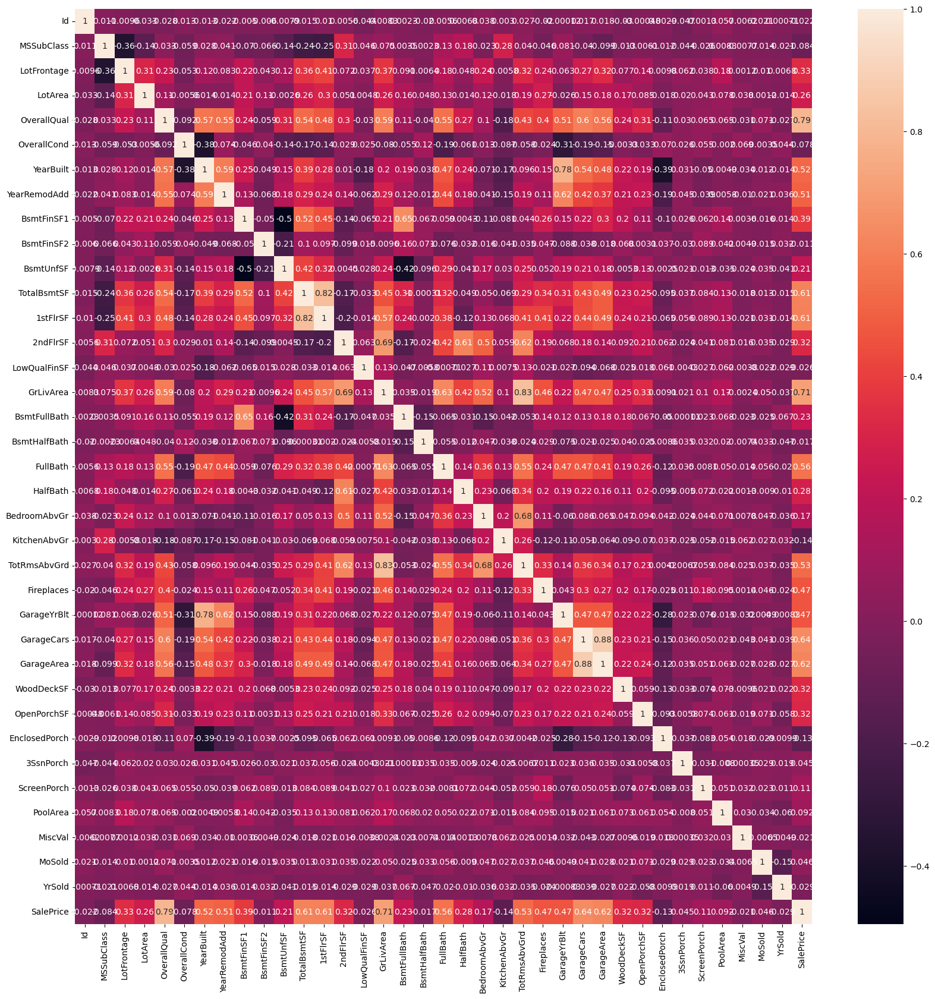

In [644]:
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),annot=True)

In [645]:
data.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,all
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.0,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,327.0,4,5,6,4,5,4,6,6,6,5,2,5,4,7,5,6,1,5,5,3,3,4,4,9,6,2
top,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,<bound method Series.apply of 0 RFn\n1 ...,TA,TA,Y,Gd,GdWo,Shed,WD,Normal,Al
freq,1151,1454,960,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,872,861.0,906,1282,647,686,1311,991,467,1294,1428,741,1365,1335,735,1360,1070,951,1460,1392,1407,1340,1457,1233,549,1267,1198,1459


In [647]:
data['LandContour']

0       Lvl
1       Lvl
2       Lvl
3       Lvl
4       Lvl
       ... 
1455    Lvl
1456    Lvl
1457    Lvl
1458    Lvl
1459    Lvl
Name: LandContour, Length: 1460, dtype: object

In [652]:
data.isnull().sum().head(40)

Id              0
MSSubClass      0
MSZoning        0
LotFrontage     0
LotArea         0
Street          0
Alley           0
LotShape        0
LandContour     0
Utilities       0
LotConfig       0
LandSlope       0
Neighborhood    0
Condition1      0
Condition2      0
BldgType        0
HouseStyle      0
OverallQual     0
OverallCond     0
YearBuilt       0
YearRemodAdd    0
RoofStyle       0
RoofMatl        0
Exterior1st     0
Exterior2nd     0
MasVnrType      0
MasVnrArea      0
ExterQual       0
ExterCond       0
Foundation      0
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinSF1      0
BsmtFinType2    0
BsmtFinSF2      0
BsmtUnfSF       0
TotalBsmtSF     0
Heating         0
dtype: int64

In [654]:
pip install sweetviz

  Using cached sweetviz-2.1.4-py3-none-any.whl (15.1 MB)
Note: you may need to restart the kernel to use updated packages.


In [657]:
import sweetviz

In [666]:
ddd=sweetviz.analyze(data)

                                             |                                             | [  0%]   00:00 ->…

In [670]:
ddd

In [664]:
data=data.drop(['GarageFinish'],axis=1)

In [671]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,2,548,TA,TA,Y,0,61,0,0,0,0,Gd,GdWo,TenC,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,2,460,TA,TA,Y,298,0,0,0,0,0,Gd,GdWo,TenC,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,2,608,TA,TA,Y,0,42,0,0,0,0,Gd,GdWo,TenC,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,3,642,TA,TA,Y,0,35,272,0,0,0,Gd,GdWo,TenC,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,3,836,TA,TA,Y,192,84,0,0,0,0,Gd,GdWo,TenC,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,GdWo,Othr,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,Othr,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,1,252,TA,TA,Y,0,60,0,0,0,0,Gd,GdPrv,Othr,2500,5,2010,WD,Normal,266500,Al
1458,1459,20,RL,68.0,9717,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd

In [674]:
data['MSSubClass']

0       60
1       20
2       60
3       70
4       60
        ..
1455    60
1456    20
1457    70
1458    20
1459    20
Name: MSSubClass, Length: 1460, dtype: int64

In [675]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all
0,1,60,RL,65.0,8450,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Gd,Attchd,2003.0,2,548,TA,TA,Y,0,61,0,0,0,0,Gd,GdWo,TenC,0,2,2008,WD,Normal,208500,Al
1,2,20,RL,80.0,9600,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,2,460,TA,TA,Y,298,0,0,0,0,0,Gd,GdWo,TenC,0,5,2007,WD,Normal,181500,Al
2,3,60,RL,68.0,11250,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,2,608,TA,TA,Y,0,42,0,0,0,0,Gd,GdWo,TenC,0,9,2008,WD,Normal,223500,Al
3,4,70,RL,60.0,9550,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,3,642,TA,TA,Y,0,35,272,0,0,0,Gd,GdWo,TenC,0,2,2006,WD,Abnorml,140000,Al
4,5,60,RL,84.0,14260,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,3,836,TA,TA,Y,192,84,0,0,0,0,Gd,GdWo,TenC,0,12,2008,WD,Normal,250000,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,2,460,TA,TA,Y,0,40,0,0,0,0,Gd,GdWo,Othr,0,8,2007,WD,Normal,175000,Al
1456,1457,20,RL,85.0,13175,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,2,500,TA,TA,Y,349,0,0,0,0,0,Gd,MnPrv,Othr,0,2,2010,WD,Normal,210000,Al
1457,1458,70,RL,66.0,9042,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,1,252,TA,TA,Y,0,60,0,0,0,0,Gd,GdPrv,Othr,2500,5,2010,WD,Normal,266500,Al
1458,1459,20,RL,68.0,9717,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd

In [676]:
data.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,all
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.0,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,327.0,4,5,6,4,5,4,6,6,6,5,2,5,4,7,5,6,5,5,3,3,4,4,9,6,2
top,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,TA,TA,Y,Gd,GdWo,Shed,WD,Normal,Al
freq,1151,1454,960,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,872,861.0,906,1282,647,686,1311,991,467,1294,1428,741,1365,1335,735,1360,1070,951,1392,1407,1340,1457,1233,549,1267,1198,1459


In [679]:
from sklearn.preprocessing import OneHotEncoder

In [689]:
dd=OneHotEncoder()

In [693]:
dd.fit_transform(data['MSSubClass'])

ValueError: Expected 2D array, got 1D array instead:
array=[60 20 60 ... 70 20 20].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [695]:
from sklearn.preprocessing import LabelEncoder

In [698]:
le=LabelEncoder()

In [701]:
le.fit_transform(data['Street'])

array([1, 1, 1, ..., 1, 1, 1])

In [700]:
data['Street'].value_counts()

Pave    1454
Grvl       6
Name: Street, dtype: int64

In [702]:
pd.get_dummies(data['Street'])

,Grvl,Pave
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
1455,0,1
1456,0,1
1457,0,1
1458,0,1


In [758]:
data.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,all
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.0,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,327.0,4,5,6,4,5,4,6,6,6,5,2,5,4,7,5,6,5,5,3,3,4,4,9,6,2
top,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,TA,TA,Y,Gd,GdWo,Shed,WD,Normal,Al
freq,1151,1454,960,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,872,861.0,906,1282,647,686,1311,991,467,1294,1428,741,1365,1335,735,1360,1070,951,1392,1407,1340,1457,1233,549,1267,1198,1459


In [759]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [760]:
data.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,all
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460.0,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,327.0,4,5,6,4,5,4,6,6,6,5,2,5,4,7,5,6,5,5,3,3,4,4,9,6,2
top,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,TA,TA,Y,Gd,GdWo,Shed,WD,Normal,Al
freq,1151,1454,960,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,872,861.0,906,1282,647,686,1311,991,467,1294,1428,741,1365,1335,735,1360,1070,951,1392,1407,1340,1457,1233,549,1267,1198,1459


In [ ]:
	MSZoning	Street	Alley	LotShape	LandContour	Utilities	LotConfig	LandSlope	Neighborhood	Condition1	Condition2	BldgType	HouseStyle	RoofStyle	RoofMatl	Exterior1st	Exterior2nd	MasVnrType	MasVnrArea	ExterQual	ExterCond	Foundation	BsmtQual	BsmtCond	BsmtExposure	BsmtFinType1	BsmtFinType2	Heating	HeatingQC	CentralAir	Electrical	KitchenQual	Functional	FireplaceQu	GarageType	GarageQual	GarageCond	PavedDrive	PoolQC	Fence	MiscFeature	SaleType	SaleCondition	all

In [779]:
data.drop(['MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','MasVnrArea','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','FireplaceQu','GarageType','GarageQual','GarageCond','PavedDrive','PoolQC','Fence','MiscFeature','SaleType','SaleCondition','all'],axis=1)

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,62.0,7917,6,5,1999,2000,0,0,953,953,953,694,0,1647,0,0,2,1,3,1,7,1,1999.0,2,460,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,85.0,13175,6,6,1978,1988,790,163,589,1542,2073,0,0,2073,1,0,2,0,3,1,7,2,1978.0,2,500,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,66.0,9042,7,9,1941,2006,275,0,877,1152,1188,1152,0,2340,0,0,2,0,4,1,9,2,1941.0,1,252,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,68.0,9717,5,6,1950,1996,49,1029,0,1078,1078,0,0,1078,1,0,1,0,2,1,5,0,1950.0,1,240,366,0,112,0,0,0,0,4,2010,142125


In [765]:
rrr.fit_transform(data['MSZoning'])

array([3, 3, 3, ..., 3, 3, 3])

In [766]:
rrr.fit_transform(data['LotShape'])

array([3, 3, 0, ..., 3, 3, 3])

In [767]:
rrr.fit_transform(data['LotConfig'])

array([4, 2, 4, ..., 4, 4, 4])

In [768]:
rrr.fit_transform(data['Neighborhood'])

array([ 5, 24,  5, ...,  6, 12,  7])

In [769]:
rrr.fit_transform(data['Condition1'])

array([2, 1, 2, ..., 2, 2, 2])

In [770]:
rrr.fit_transform(data['Condition2'])

array([2, 2, 2, ..., 2, 2, 2])

In [770]:
rrr.fit_transform(data['HouseStyle'])

array([2, 2, 2, ..., 2, 2, 2])

In [772]:
rrr.fit_transform(data['RoofStyle'])

array([1, 1, 1, ..., 1, 3, 1])

In [721]:
bata=data[['MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','BldgType','RoofStyle','MasVnrType','MasVnrArea','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','HeatingQC','CentralAir','Electrical','KitchenQual','FireplaceQu','GarageType','GarageQual','GarageCond','PavedDrive','PoolQC','Fence','MiscFeature','all']]

In [755]:
bata

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,BldgType,RoofStyle,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,FireplaceQu,GarageType,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,all
0,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Gd,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
1,RL,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,1Fam,Gable,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,TA,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
2,RL,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,1Fam,Gable,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,TA,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
3,RL,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,1Fam,Gable,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Gd,Detchd,TA,TA,Y,Gd,GdWo,TenC,Al
4,RL,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,1Fam,Gable,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,TA,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,TA,Attchd,TA,TA,Y,Gd,GdWo,Othr,Al
1456,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,TA,TA,Attchd,TA,TA,Y,Gd,MnPrv,Othr,Al
1457,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Gd,Attchd,TA,TA,Y,Gd,GdPrv,Othr,Al
1458,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Hip,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,Gd,Gd,Attchd,TA,TA,Y,Gd,GdWo,Othr,Al


In [780]:
cata=pd.get_dummies(bata)#,drop_first=True)

C:\Users\syed mujahid\anaconda3\lib\site-packages\pandas\core\algorithms.py:798: FutureWarning:

In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)



In [783]:
data=pd.concat((data,cata),axis=1)

In [785]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,

In [724]:
data['MSSubClass']

0       60
1       20
2       60
3       70
4       60
        ..
1455    60
1456    20
1457    70
1458    20
1459    20
Name: MSSubClass, Length: 1460, dtype: int64

In [729]:
dd4=LabelEncoder()

In [750]:
gg=bata.iloc[:,10:11]

In [751]:
dd4.fit_transform(gg)

C:\Users\syed mujahid\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



array([1, 2, 1, ..., 2, 2, 2])

In [752]:
 bata

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,BldgType,RoofStyle,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,FireplaceQu,GarageType,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,all
0,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Gd,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
1,RL,Pave,Pave,Reg,Lvl,AllPub,FR2,Gtl,1Fam,Gable,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,TA,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
2,RL,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,1Fam,Gable,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,TA,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
3,RL,Pave,Pave,IR1,Lvl,AllPub,Corner,Gtl,1Fam,Gable,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Gd,Detchd,TA,TA,Y,Gd,GdWo,TenC,Al
4,RL,Pave,Pave,IR1,Lvl,AllPub,FR2,Gtl,1Fam,Gable,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,TA,Attchd,TA,TA,Y,Gd,GdWo,TenC,Al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,TA,Attchd,TA,TA,Y,Gd,GdWo,Othr,Al
1456,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,TA,TA,Attchd,TA,TA,Y,Gd,MnPrv,Othr,Al
1457,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Gable,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Gd,Attchd,TA,TA,Y,Gd,GdPrv,Othr,Al
1458,RL,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,1Fam,Hip,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,Gd,Gd,Attchd,TA,TA,Y,Gd,GdWo,Othr,Al


In [754]:
data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
all              0
Length: 81, dtype: int64

In [788]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,

In [792]:
data.corr()['SalePrice']

Id                 -0.021917
MSSubClass         -0.084284
LotFrontage         0.334901
LotArea             0.263843
OverallQual         0.790982
                      ...   
MiscFeature_Othr   -0.025310
MiscFeature_Shed    0.028390
MiscFeature_TenC   -0.023315
all_Al              0.014314
all_NoSeWa         -0.014314
Name: SalePrice, Length: 505, dtype: float64

In [793]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,MasVnrArea_233.0,MasVnrArea_234.0,MasVnrArea_236.0,MasVnrArea_237.0,MasVnrArea_238.0,MasVnrArea_240.0,MasVnrArea_243.0,MasVnrArea_244.0,MasVnrArea_245.0,MasVnrArea_246.0,MasVnrArea_247.0,MasVnrArea_248.0,MasVnrArea_250.0,MasVnrArea_252.0,MasVnrArea_254.0,MasVnrArea_255.0,MasVnrArea_256.0,MasVnrArea_258.0,MasVnrArea_259.0,MasVnrArea_260.0,MasVnrArea_261.0,MasVnrArea_262.0,MasVnrArea_263.0,MasVnrArea_266.0,MasVnrArea_268.0,MasVnrArea_270.0,MasVnrArea

In [794]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,

<AxesSubplot:>

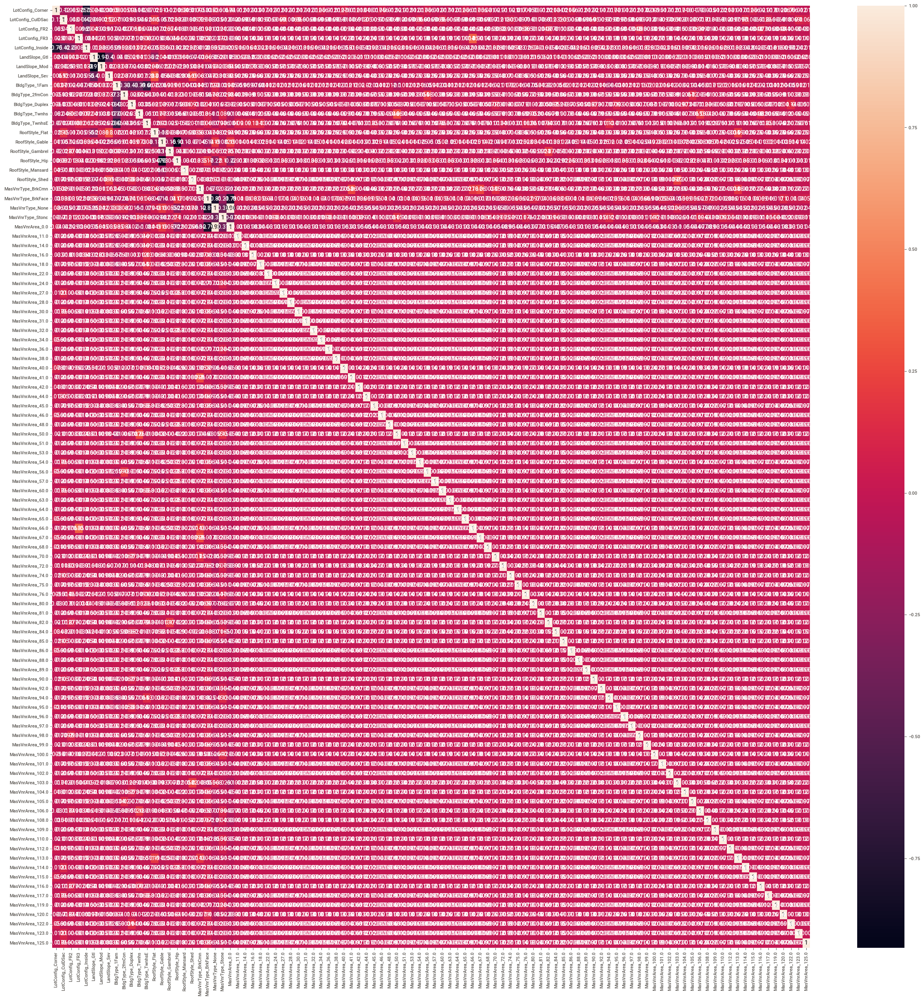

In [816]:
plt.figure(figsize=(30,30))
sns.heatmap(data.iloc[:,100:200].corr(),annot=True)

<AxesSubplot:>

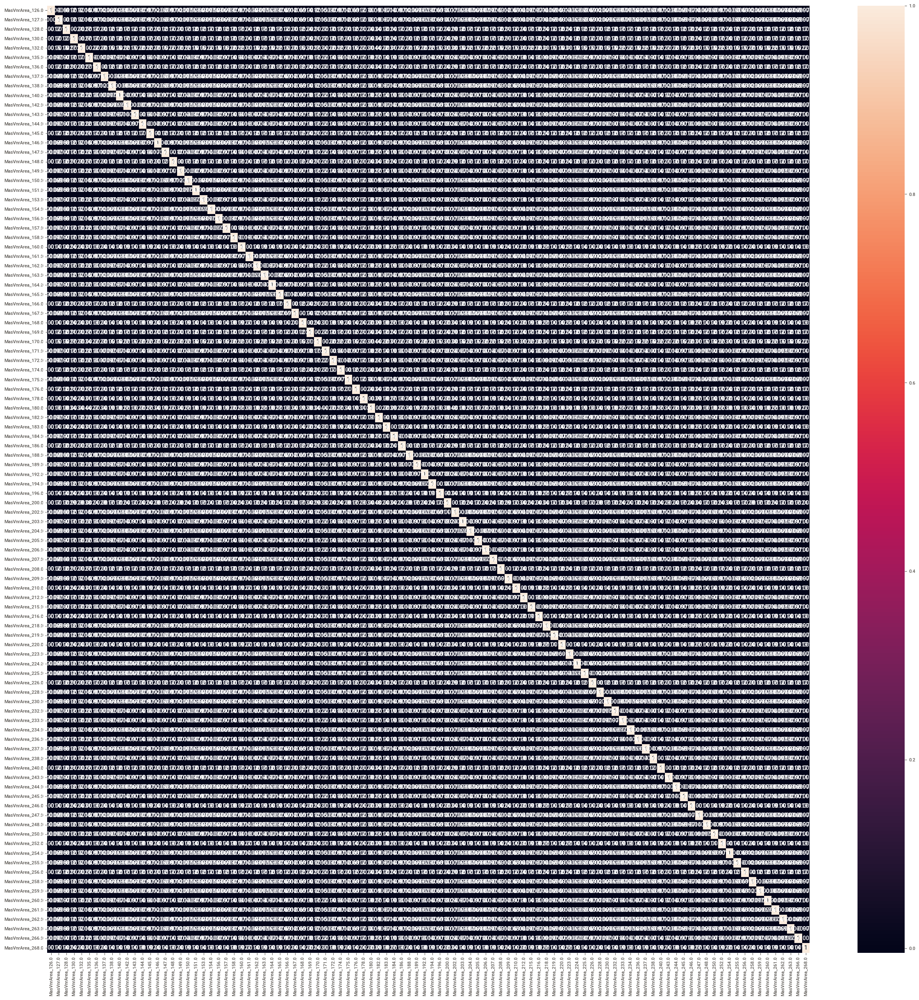

In [817]:
plt.figure(figsize=(30,30))
sns.heatmap(data.iloc[:,200:300].corr(),annot=True)

too many features are there thats why cant do feature extraction

In [818]:
from sklearn.preprocessing import MinMaxScaler

In [820]:
mmn=MinMaxScaler()

In [ ]:
mmn

In [822]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,all,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,

In [829]:

for i in data:
    if i in bata:
        data=data.drop((i),axis=1)
print(data)

        Id  MSSubClass  LotFrontage  LotArea Neighborhood Condition1  \
0        1          60         65.0     8450      CollgCr       Norm   
1        2          20         80.0     9600      Veenker      Feedr   
2        3          60         68.0    11250      CollgCr       Norm   
3        4          70         60.0     9550      Crawfor       Norm   
4        5          60         84.0    14260      NoRidge       Norm   
...    ...         ...          ...      ...          ...        ...   
1455  1456          60         62.0     7917      Gilbert       Norm   
1456  1457          20         85.0    13175       NWAmes       Norm   
1457  1458          70         66.0     9042      Crawfor       Norm   
1458  1459          20         68.0     9717        NAmes       Norm   
1459  1460          20         75.0     9937      Edwards       Norm   

     Condition2 HouseStyle  OverallQual  OverallCond  YearBuilt  YearRemodAdd  \
0          Norm     2Story            7            5  

In [858]:
data=pd.get_dummies(data,drop_first=False)

In [853]:
data[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea']]=mmn.fit_transform(data[['BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea']])

In [854]:
data['HouseStyle'].unique()

array(['2Story', '1Story', '1.5Fin', '1.5Unf', 'SFoyer', 'SLvl', '2.5Unf',
       '2.5Fin'], dtype=object)

In [859]:
data

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,MasVnrArea_233.0,MasVnrArea_234.0,MasVnrArea_236.0,MasVnrArea_237.0,MasVnrArea_238.0,MasVnrArea_240.0,MasVnrArea_243.0,MasVnrArea_244.0,MasVnrArea_245.0,MasVnrArea_246.0,MasVnrArea_247.0,MasVnrArea_248.0,MasVnrArea_250.0,MasVnrArea_252.0,MasVnrArea_254.0,MasVnrArea_255.0,MasVnrArea_256.0,MasVnrArea_258.0,MasVnrArea_259.0,MasVnrArea_260.0,MasVnrArea_261.0,MasVnrArea_262.0,MasVnrArea_263.0,MasVnrArea_266.0,MasVnrArea_268.0,MasVnrArea_270.0,MasVnrArea

# model building

In [862]:
X=data.drop(['SalePrice'],axis=1)

In [863]:
y=data['SalePrice']

In [860]:
from sklearn.model_selection import train_test_split

In [869]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.2,random_state=42)

In [870]:
X_train

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,MasVnrArea_233.0,MasVnrArea_234.0,MasVnrArea_236.0,MasVnrArea_237.0,MasVnrArea_238.0,MasVnrArea_240.0,MasVnrArea_243.0,MasVnrArea_244.0,MasVnrArea_245.0,MasVnrArea_246.0,MasVnrArea_247.0,MasVnrArea_248.0,MasVnrArea_250.0,MasVnrArea_252.0,MasVnrArea_254.0,MasVnrArea_255.0,MasVnrArea_256.0,MasVnrArea_258.0,MasVnrArea_259.0,MasVnrArea_260.0,MasVnrArea_261.0,MasVnrArea_262.0,MasVnrArea_263.0,MasVnrArea_266.0,MasVnrArea_268.0,MasVnrArea_270.0,MasVnrArea_272.0,Mas

In [871]:
y_train

254     145000
1066    178000
638      85000
799     175000
380     127000
         ...  
1095    176432
1130    135000
1294    115000
860     189950
1126    174000
Name: SalePrice, Length: 1168, dtype: int64

In [874]:
X_test

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrArea_0.0,MasVnrArea_11.0,MasVnrArea_14.0,MasVnrArea_16.0,MasVnrArea_18.0,MasVnrArea_22.0,MasVnrArea_24.0,MasVnrArea_27.0,MasVnrArea_28.0,MasVnrArea_30.0,MasVnrArea_31.0,MasVnrArea_32.0,MasVnrArea_34.0,MasVnrArea_36.0,MasVnrArea_38.0,MasVnrArea_40.0,MasVnrArea_41.0,MasVnrArea_42.0,MasVnrArea_44.0,MasVnrArea_45.0,MasVnrArea_46.0,MasVnrArea_48.0,MasVnrArea_50.0,MasVnrArea_51.0,MasVnrArea_53.0,MasVnrArea_54.0,MasVnrArea_56.0,MasVnrArea_57.0,MasVnrArea_60.0,MasVnrArea_63.0,MasVnrArea_64.0,MasVnrArea_65.0,MasVnrArea_66.0,MasVnrArea_67.0,MasVnrArea_68.0,MasVnrArea_70.0,MasVnrArea_72.0,MasVnrArea_74.0,MasVnrArea_75.0,MasVnrArea_76.0,MasVnrArea_80.0,MasVnrArea_81.0,MasVnrArea_82.0,MasVnrArea_84.0,MasVnrArea_85.0,MasVnrArea_86.0,MasVnrArea_88.0,MasVnrArea_89.0,MasVnrArea_90.0,MasVnrArea_92.0,MasVnrArea_94.0,MasVnrArea_95.0,MasVnrArea_96.0,MasVnrArea_97.0,MasVnrArea_98.0,MasVnrArea_99.0,MasVnrArea_100.0,MasVnrArea_101.0,MasVnrArea_102.0,MasVnrArea_103.0,MasVnrArea_104.0,MasVnrArea_105.0,MasVnrArea_106.0,MasVnrArea_108.0,MasVnrArea_109.0,MasVnrArea_110.0,MasVnrArea_112.0,MasVnrArea_113.0,MasVnrArea_114.0,MasVnrArea_115.0,MasVnrArea_116.0,MasVnrArea_117.0,MasVnrArea_119.0,MasVnrArea_120.0,MasVnrArea_122.0,MasVnrArea_123.0,MasVnrArea_125.0,MasVnrArea_126.0,MasVnrArea_127.0,MasVnrArea_128.0,MasVnrArea_130.0,MasVnrArea_132.0,MasVnrArea_135.0,MasVnrArea_136.0,MasVnrArea_137.0,MasVnrArea_138.0,MasVnrArea_140.0,MasVnrArea_142.0,MasVnrArea_143.0,MasVnrArea_144.0,MasVnrArea_145.0,MasVnrArea_146.0,MasVnrArea_147.0,MasVnrArea_148.0,MasVnrArea_149.0,MasVnrArea_150.0,MasVnrArea_151.0,MasVnrArea_153.0,MasVnrArea_154.0,MasVnrArea_156.0,MasVnrArea_157.0,MasVnrArea_158.0,MasVnrArea_160.0,MasVnrArea_161.0,MasVnrArea_162.0,MasVnrArea_163.0,MasVnrArea_164.0,MasVnrArea_165.0,MasVnrArea_166.0,MasVnrArea_167.0,MasVnrArea_168.0,MasVnrArea_169.0,MasVnrArea_170.0,MasVnrArea_171.0,MasVnrArea_172.0,MasVnrArea_174.0,MasVnrArea_175.0,MasVnrArea_176.0,MasVnrArea_178.0,MasVnrArea_180.0,MasVnrArea_182.0,MasVnrArea_183.0,MasVnrArea_184.0,MasVnrArea_186.0,MasVnrArea_188.0,MasVnrArea_189.0,MasVnrArea_192.0,MasVnrArea_194.0,MasVnrArea_196.0,MasVnrArea_200.0,MasVnrArea_202.0,MasVnrArea_203.0,MasVnrArea_204.0,MasVnrArea_205.0,MasVnrArea_206.0,MasVnrArea_207.0,MasVnrArea_208.0,MasVnrArea_209.0,MasVnrArea_210.0,MasVnrArea_212.0,MasVnrArea_215.0,MasVnrArea_216.0,MasVnrArea_218.0,MasVnrArea_219.0,MasVnrArea_220.0,MasVnrArea_223.0,MasVnrArea_224.0,MasVnrArea_225.0,MasVnrArea_226.0,MasVnrArea_228.0,MasVnrArea_230.0,MasVnrArea_232.0,MasVnrArea_233.0,MasVnrArea_234.0,MasVnrArea_236.0,MasVnrArea_237.0,MasVnrArea_238.0,MasVnrArea_240.0,MasVnrArea_243.0,MasVnrArea_244.0,MasVnrArea_245.0,MasVnrArea_246.0,MasVnrArea_247.0,MasVnrArea_248.0,MasVnrArea_250.0,MasVnrArea_252.0,MasVnrArea_254.0,MasVnrArea_255.0,MasVnrArea_256.0,MasVnrArea_258.0,MasVnrArea_259.0,MasVnrArea_260.0,MasVnrArea_261.0,MasVnrArea_262.0,MasVnrArea_263.0,MasVnrArea_266.0,MasVnrArea_268.0,MasVnrArea_270.0,MasVnrArea_272.0,Mas

In [918]:
from sklearn.ensemble import GradientBoostingRegressor

In [919]:
ff=[DecisionTreeRegressor(),RandomForestRegressor(),LinearRegression(),SVR(),XGBRegressor(),GradientBoostingRegressor()]

In [920]:
from sklearn.pipeline import Pipeline

In [921]:

for i in ff:
    step1=i

    fgg=Pipeline([('step1',step1)
                 ])

    gg=fgg.fit(X_train,y_train)

    y_pred=gg.predict(X_test)

    print('r2_score',i,r2_score(y_test,y_pred))

    print('mse',mean_squared_error(y_test,y_pred))


r2_score DecisionTreeRegressor() 0.7715841441044111
mse 1752024125.6130137
r2_score RandomForestRegressor() 0.8833783395992498
mse 894526178.0975515
r2_score LinearRegression() -10708877288779.955
mse 8.214058211768757e+22
r2_score SVR() -0.024922646887663324
mse 7861491038.76204
r2_score XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...) 0.8751

In [938]:
from sklearn.model_selection import GridSearchCV

In [959]:
n_estimators=[20,40,50,60,80,100]
max_depth=[1,5,8,20,50]
min_samples_leaf=[1,5,8,10]
min_samples_split=[1,2,5,10]

In [960]:
param_grids={'n_estimators':n_estimators,
            'max_depth':max_depth,
             'min_samples_leaf':max_sample_leaf,
             'min_samples_split':min_sample_split}
             

In [961]:
from sklearn.ensemble import GradientBoostingRegressor

In [962]:
tgt=GradientBoostingRegressor()

In [963]:
v1=GridSearchCV(estimator=tgt,
            param_grid=param_grids,
            n_jobs=-1,
            verbose=2,
            cv=5
            )

In [ ]:
v1.fit(X_train,y_train)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits
